Author: Davor Jordacevic

#1. Instalacija i priprema okruzenja

In [ ]:
!pip install pycaret
!pip install tqdm
!pip install -U plotly 
!pip install plotly-geo
!pip install geopandas
!pip install pyshp
!pip install shapely
!pip install sweetviz
!pip install -q kaggle
!pip install -q kaggle-cli
!pip install pystan==2.19.1.1
!pip install fbprophet
!pip install pycountry
!pip install geojson

In [1]:
import os
import json
import math
import IPython
import zipfile
import pycountry
import numpy as np
import pandas as pd
import sklearn as sk
import pycaret as pc
import seaborn as sns
import sweetviz as sv
import matplotlib as mpl
import plotly.io as pio
import plotly.express as px
import plotly.graph_objs as go

from fbprophet import Prophet
from collections import namedtuple
from matplotlib import pyplot as plt
from plotly.subplots import make_subplots
from fbprophet.diagnostics import cross_validation
from fbprophet.plot import plot_cross_validation_metric
from fbprophet.serialize import model_to_json, model_from_json
from fbprophet.plot import plot_plotly, plot_components_plotly, add_changepoints_to_plot

plt.style.use('ggplot')

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [114]:
# The combination of user and the key is unique
# This parametars can be found in kaggle.json file which can
# be downloaded from kaggle
user = " "
key  = " "

if '.kaggle' not in os.listdir('/root'):
  !mkdir ~/.kaggle
!touch /root/.kaggle/kaggle.json
!chmod 666 /root/.kaggle/kaggle.json
with open('/root/.kaggle/kaggle.json', 'w') as f:
  f.write('{"username":"%s","key":"%s"}' % (user, key))
!chmod 600 /root/.kaggle/kaggle.json

In [4]:
!ls -l ~/.kaggle
!cat ~/.kaggle/kaggle.json

total 4
-rw------- 1 root root 73 Aug 30 19:07 kaggle.json
{"username":"davorjordacevic97","key":"3d1dd9afd392eac6a3b88ca53a93ee6b"}

In [5]:
!kaggle datasets download -d sudalairajkumar/novel-corona-virus-2019-dataset

 70% 6.00M/8.52M [00:00<00:00, 61.9MB/s]
100% 8.52M/8.52M [00:00<00:00, 54.5MB/s]


In [6]:
!ls -la

total 8736
drwxr-xr-x 1 root root    4096 Aug 30 19:07 .
drwxr-xr-x 1 root root    4096 Aug 30 19:02 ..
drwxr-xr-x 4 root root    4096 Aug 25 13:35 .config
-rw-r--r-- 1 root root 8928752 Aug 30 19:07 novel-corona-virus-2019-dataset.zip
drwxr-xr-x 1 root root    4096 Aug 25 13:35 sample_data


In [7]:
with zipfile.ZipFile("novel-corona-virus-2019-dataset.zip","r") as zip_ref:
  zip_ref.extractall("novel-corona-virus-2019-dataset")

In [8]:
!ls -la

total 8740
drwxr-xr-x 1 root root    4096 Aug 30 19:07 .
drwxr-xr-x 1 root root    4096 Aug 30 19:02 ..
drwxr-xr-x 4 root root    4096 Aug 25 13:35 .config
drwxr-xr-x 2 root root    4096 Aug 30 19:07 novel-corona-virus-2019-dataset
-rw-r--r-- 1 root root 8928752 Aug 30 19:07 novel-corona-virus-2019-dataset.zip
drwxr-xr-x 1 root root    4096 Aug 25 13:35 sample_data


In [9]:
%cd novel-corona-virus-2019-dataset/

/content/novel-corona-virus-2019-dataset


In [10]:
!ls -la

total 34588
drwxr-xr-x 2 root root     4096 Aug 30 19:07 .
drwxr-xr-x 1 root root     4096 Aug 30 19:07 ..
-rw-r--r-- 1 root root 22535273 Aug 30 19:07 covid_19_data.csv
-rw-r--r-- 1 root root   647741 Aug 30 19:07 time_series_covid_19_confirmed.csv
-rw-r--r-- 1 root root  6597690 Aug 30 19:07 time_series_covid_19_confirmed_US.csv
-rw-r--r-- 1 root root   448965 Aug 30 19:07 time_series_covid_19_deaths.csv
-rw-r--r-- 1 root root  4586098 Aug 30 19:07 time_series_covid_19_deaths_US.csv
-rw-r--r-- 1 root root   584387 Aug 30 19:07 time_series_covid_19_recovered.csv


#2. Ucitavanje podataka i prikaz osnovnih informacija o dataset-u

In [11]:
data = pd.read_csv("covid_19_data.csv")
data.tail()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
306424,306425,05/29/2021,Zaporizhia Oblast,Ukraine,2021-05-30 04:20:55,102641.0,2335.0,95289.0
306425,306426,05/29/2021,Zeeland,Netherlands,2021-05-30 04:20:55,29147.0,245.0,0.0
306426,306427,05/29/2021,Zhejiang,Mainland China,2021-05-30 04:20:55,1364.0,1.0,1324.0
306427,306428,05/29/2021,Zhytomyr Oblast,Ukraine,2021-05-30 04:20:55,87550.0,1738.0,83790.0
306428,306429,05/29/2021,Zuid-Holland,Netherlands,2021-05-30 04:20:55,391559.0,4252.0,0.0


**Data Table Display**

Colab includes an extension that renders pandas dataframes into interactive displays that can be filtered, sorted, and explored dynamically.

Data table display for Pandas dataframes can be enabled by running:
```python
%load_ext google.colab.data_table
```
and disabled by running
```python
%unload_ext google.colab.data_table
```


In [12]:
%load_ext google.colab.data_table

In [13]:
from google.colab import data_table
data_table.DataTable(data, include_index=False, num_rows_per_page=10)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
306424,306425,05/29/2021,Zaporizhia Oblast,Ukraine,2021-05-30 04:20:55,102641.0,2335.0,95289.0
306425,306426,05/29/2021,Zeeland,Netherlands,2021-05-30 04:20:55,29147.0,245.0,0.0
306426,306427,05/29/2021,Zhejiang,Mainland China,2021-05-30 04:20:55,1364.0,1.0,1324.0
306427,306428,05/29/2021,Zhytomyr Oblast,Ukraine,2021-05-30 04:20:55,87550.0,1738.0,83790.0


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306429 entries, 0 to 306428
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   SNo              306429 non-null  int64  
 1   ObservationDate  306429 non-null  object 
 2   Province/State   228329 non-null  object 
 3   Country/Region   306429 non-null  object 
 4   Last Update      306429 non-null  object 
 5   Confirmed        306429 non-null  float64
 6   Deaths           306429 non-null  float64
 7   Recovered        306429 non-null  float64
dtypes: float64(3), int64(1), object(4)
memory usage: 18.7+ MB


In [15]:
data.count()

SNo                306429
ObservationDate    306429
Province/State     228329
Country/Region     306429
Last Update        306429
Confirmed          306429
Deaths             306429
Recovered          306429
dtype: int64

#3. Analiza podataka

In [16]:
# Koriscenjem sweetviz paketa mozemo dobiti uvid u podatke u html obliku
report = sv.analyze(data)
# Sledeca naredba ce generisati html fajl na osnovu prethodno uradjene analize
#report.show_html()
# Prikazivanje html fajlapip install bamboolib
#IPython.display.HTML(filename='SWEETVIZ_REPORT.html')

                                             |          | [  0%]   00:00 -> (? left)



---



In [20]:
data_confirmed = pd.read_csv("time_series_covid_19_confirmed.csv")
data_confirmed.tail()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,4/20/21,4/21/21,4/22/21,4/23/21,4/24/21,4/25/21,4/26/21,4/27/21,4/28/21,4/29/21,4/30/21,5/1/21,5/2/21,5/3/21,5/4/21,5/5/21,5/6/21,5/7/21,5/8/21,5/9/21,5/10/21,5/11/21,5/12/21,5/13/21,5/14/21,5/15/21,5/16/21,5/17/21,5/18/21,5/19/21,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
271,NaN,Vietnam,14.058324,108.277199,0,2,2,2,2,2,2,2,2,2,6,6,8,8,8,10,10,13,13,14,15,15,16,16,16,16,16,16,16,16,16,16,16,16,16,16,...,2800,2812,2824,2830,2833,2843,2852,2857,2865,2910,2928,2942,2962,2985,2995,3030,3090,3137,3245,3412,3489,3571,3658,3740,3816,4112,4212,4359,4512,4720,4809,4941,5119,5275,5404,5931,6086,6356,6396,6908
272,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,284280,286028,287680,289120,290259,290972,292052,293466,294550,295601,296462,296462,297638,298203,298921,299736,300387,300946,301437,301751,302249,302777,303270,303270,303270,303658,303827,304074,304074,304532,304532,304968,305201,305201,305777,306334,306795,306795,307569,307838
273,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,5918,5960,6020,6056,6105,6137,6183,6220,6263,6294,6317,6325,6341,6363,6390,6414,6426,6446,6462,6482,6485,6492,6498,6507,6523,6538,6543,6568,6586,6593,6613,6632,6649,6658,6662,6670,6688,6696,6723,6731
274,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,91042,91119,91189,91251,91317,91358,91378,91418,91484,91533,91586,91670,91693,91722,91804,91849,91946,92004,92057,92092,92112,92152,92211,92262,92356,92409,92436,92460,92520,92630,92754,92920,93106,93201,93279,93428,93627,93947,94430,94751
275,NaN,Zimbabwe,-19.015438,29.154857,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,37875,37980,38018,38045,38064,38086,38102,38164,38191,38235,38257,38260,38281,38293,38327,38357,38398,38403,38414,38419,38433,38448,38466,38491,38535,38554,38560,38572,38595,38612,38635,38664,38679,38682,38696,38706,38819,38854,38918,38933


In [21]:
data_deaths = pd.read_csv("time_series_covid_19_deaths.csv")
data_deaths.tail()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,4/20/21,4/21/21,4/22/21,4/23/21,4/24/21,4/25/21,4/26/21,4/27/21,4/28/21,4/29/21,4/30/21,5/1/21,5/2/21,5/3/21,5/4/21,5/5/21,5/6/21,5/7/21,5/8/21,5/9/21,5/10/21,5/11/21,5/12/21,5/13/21,5/14/21,5/15/21,5/16/21,5/17/21,5/18/21,5/19/21,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
271,NaN,Vietnam,14.058324,108.277199,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,36,37,37,37,37,39,41,42,43,44,44,45,46,47,47
272,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3078,3096,3115,3138,3151,3167,3184,3201,3206,3231,3249,3249,3272,3283,3296,3317,3326,3338,3351,3358,3378,3393,3401,3401,3401,3423,3428,3437,3437,3448,3448,3452,3459,3459,3470,3480,3483,3483,3489,3492
273,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1138,1147,1157,1165,1175,1187,1205,1207,1216,1222,1226,1229,1233,1239,1240,1260,1265,1269,1270,1271,1275,1276,1277,1278,1285,1285,1289,1294,1297,1298,1301,1302,1304,1307,1310,1311,1313,1315,1316,1319
274,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1236,1238,1240,1245,1245,1246,1248,1249,1249,1250,1251,1251,1253,1253,1254,1255,1256,1256,1257,1257,1257,1258,1259,1260,1260,1260,1260,1261,1263,1263,1265,1266,1267,1268,1271,1271,1273,1275,1275,1276
275,NaN,Zimbabwe,-19.015438,29.154857,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1554,1555,1555,1556,1556,1557,1560,1565,1565,1567,1567,1568,1570,1573,1574,1574,1575,1576,1576,1576,1576,1579,1579,1582,1582,1582,1582,1582,1583,1583,1585,1586,1586,1586,1586,1587,1589,1592,1592,1594


In [22]:
data_recovered = pd.read_csv("time_series_covid_19_recovered.csv")
data_recovered.tail()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,4/20/21,4/21/21,4/22/21,4/23/21,4/24/21,4/25/21,4/26/21,4/27/21,4/28/21,4/29/21,4/30/21,5/1/21,5/2/21,5/3/21,5/4/21,5/5/21,5/6/21,5/7/21,5/8/21,5/9/21,5/10/21,5/11/21,5/12/21,5/13/21,5/14/21,5/15/21,5/16/21,5/17/21,5/18/21,5/19/21,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
256,NaN,Vietnam,14.058324,108.277199,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,6,6,7,7,7,7,7,7,7,7,14,14,14,14,16,16,...,2490,2490,2490,2490,2490,2516,2516,2516,2516,2516,2516,2548,2549,2560,2560,2560,2560,2560,2602,2602,2618,2618,2636,2657,2657,2668,2668,2668,2687,2687,2687,2689,2721,2721,2794,2794,2853,2853,2896,2896
257,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,251663,254199,256559,259105,260650,262602,264660,267346,268054,271233,272333,272333,275392,276171,277673,279652,281586,283570,285575,286385,287206,287932,288891,288891,288891,291191,292523,293808,293808,295643,295643,296901,297201,297201,298502,299024,299559,299559,300125,300524
258,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2281,2309,2393,2454,2486,2546,2630,2674,2700,2731,2751,2794,2875,2910,2948,2966,2971,2978,2983,2992,3001,3003,3003,3003,3008,3014,3023,3042,3072,3120,3159,3179,3201,3245,3260,3273,3306,3339,3375,3399
259,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,88900,88956,89117,89256,89403,89574,89678,89717,89743,89852,89933,90012,90082,90130,90166,90198,90264,90316,90363,90428,90501,90539,90574,90635,90699,90777,90816,90862,90892,90919,90955,91019,91102,91156,91200,91221,91239,91321,91443,91594
260,NaN,Zimbabwe,-19.015438,29.154857,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,35058,35065,35073,35094,35101,35123,35149,35480,35517,35594,35612,35620,35634,35647,35775,35811,36027,36041,36052,36063,36208,36221,36277,36286,36308,36318,36329,36349,36371,36416,36427,36435,36445,36453,36471,36517,36531,36541,36563,36578




---



#4. Preprocessing

In [23]:
data.rename(columns={'ObservationDate':'Date', 'Country/Region':'Country'}, inplace=True)

data['Country']= data['Country'].str.replace("Mainland China", "China")
data['Country']= data['Country'].str.replace("US", "Unites States")

data_confirmed.rename(columns={'Country/Region':'Country'}, inplace=True)
data_recovered.rename(columns={'Country/Region':'Country'}, inplace=True)
data_deaths.rename(columns={'Country/Region':'Country'}, inplace=True)

data_confirmed['Country']= data_confirmed['Country'].str.replace("Mainland China", "China")
data_confirmed['Country']= data_confirmed['Country'].str.replace("US", "Unites States")
data_recovered['Country']= data_recovered['Country'].str.replace("Mainland China", "China")
data_recovered['Country']= data_recovered['Country'].str.replace("US", "Unites States")
data_deaths['Country']= data_deaths['Country'].str.replace("Mainland China", "China")
data_deaths['Country']= data_deaths['Country'].str.replace("US", "Unites States")

In [24]:
data_grouped = data.groupby(["Date", "Country", "Province/State"])[['SNo', 'Date', 'Province/State', 'Country', 'Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

In [25]:
data_grouped

,Date,Country,Province/State,SNo,Confirmed,Deaths,Recovered
0,01/01/2021,Australia,Australian Capital Territory,192681,118.0,3.0,114.0
1,01/01/2021,Australia,New South Wales,192986,4947.0,54.0,0.0
2,01/01/2021,Australia,Northern Territory,193003,75.0,0.0,71.0
3,01/01/2021,Australia,Queensland,193058,1255.0,6.0,1224.0
4,01/01/2021,Australia,South Australia,193119,580.0,4.0,566.0
...,...,...,...,...,...,...,...
228319,12/31/2020,Unites States,Virginia,192434,349584.0,5032.0,0.0
228320,12/31/2020,Unites States,Washington,192443,246752.0,3461.0,0.0
228321,12/31/2020,Unites States,West Virginia,192446,85334.0,1338.0,0.0
228322,12/31/2020,Unites States,Wisconsin,192448,520438.0,5242.0,0.0


In [26]:
data.query('Country=="Serbia"').groupby("Last Update")[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Last Update,Confirmed,Deaths,Recovered
0,2020-03-06T15:43:02,4.0,0.0,0.0
1,2020-03-10T18:53:03,5.0,0.0,0.0
2,2020-03-11T09:53:03,12.0,0.0,0.0
3,2020-03-11T20:00:00,35.0,0.0,0.0
4,2020-03-12T09:13:24,19.0,0.0,0.0
...,...,...,...,...
108,2021-05-30 04:20:55,712046.0,6844.0,0.0
109,3/8/20 5:31,2407.0,41.0,2.0
110,4/2/20 8:53,1171.0,31.0,0.0
111,4/4/20 9:38,1624.0,44.0,0.0


In [27]:
data.groupby("Country")[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Country,Confirmed,Deaths,Recovered
0,Azerbaijan,1.0,0.0,0.0
1,"('St. Martin',)",2.0,0.0,0.0
2,Afghanistan,17026442.0,669075.0,13464399.0
3,Albania,19768869.0,375955.0,13945256.0
4,Algeria,27684358.0,834464.0,18959299.0
...,...,...,...,...
223,West Bank and Gaza,41819444.0,440378.0,37003116.0
224,Yemen,962066.0,237613.0,506523.0
225,Zambia,13493953.0,205990.0,12625626.0
226,Zimbabwe,6484581.0,237234.0,5594887.0


In [28]:
data['Date'] = pd.to_datetime(data['Date'].astype(str), format='%m/%d/%Y')

In [29]:
confirmed = data.groupby('Date').sum()['Confirmed'].reset_index()
deaths = data.groupby('Date').sum()['Deaths'].reset_index()
recovered = data.groupby('Date').sum()['Recovered'].reset_index()

In [30]:
confirmed = confirmed.sort_values('Date', ascending=False)
deaths = deaths.sort_values('Date', ascending=False)
recovered = recovered.sort_values('Date', ascending=False)

In [31]:
fig = go.Figure()
fig.add_trace(go.Bar(x=confirmed['Date'],
                y=confirmed['Confirmed'],
                name='Confirmed',
                marker_color='blue'
                ))
fig.add_trace(go.Bar(x=deaths['Date'],
                y=deaths['Deaths'],
                name='Deaths',
                marker_color='Red'
                ))
fig.add_trace(go.Bar(x=recovered['Date'],
                y=recovered['Recovered'],
                name='Recovered',
                marker_color='Green'
                ))

fig.update_layout(
    title='Worldwide Corona Virus Cases - Confirmed, Deaths, Recovered (Bar Chart)',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Number of Cases',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=confirmed['Date'], 
                         y=confirmed['Confirmed'],
                         mode='lines+markers',
                         name='Confirmed',
                         line=dict(color='blue', width=2)
                        ))
fig.add_trace(go.Scatter(x=deaths['Date'], 
                         y=deaths['Deaths'],
                         mode='lines+markers',
                         name='Deaths',
                         line=dict(color='Red', width=2)
                        ))
fig.add_trace(go.Scatter(x=recovered['Date'], 
                         y=recovered['Recovered'],
                         mode='lines+markers',
                         name='Recovered',
                         line=dict(color='Green', width=2)
                        ))
fig.update_layout(
    title='Worldwide Corona Virus Cases - Confirmed, Deaths, Recovered (Line Chart)',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Number of Cases',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    )
)
fig.show()

In [33]:
confirmed = data.groupby('Date').sum()['Confirmed'].reset_index()
deaths = data.groupby('Date').sum()['Deaths'].reset_index()
recovered = data.groupby('Date').sum()['Recovered'].reset_index()

confirmed = confirmed.sort_values('Date', ascending=False)
deaths = deaths.sort_values('Date', ascending=False)
recovered = recovered.sort_values('Date', ascending=False)

In [34]:
confirmed.columns = ['ds','y']
confirmed['ds'] = pd.to_datetime(confirmed['ds'])

confirmed.tail()

,ds,y
4,2020-01-26,2118.0
3,2020-01-25,1437.0
2,2020-01-24,941.0
1,2020-01-23,1097.0
0,2020-01-22,557.0




---



#5. Analiza vremenskih serija i predikcija

**Prophet** is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.

Prophet is open source software released by Facebook's Core Data Science team .

Full documentation and examples available at the homepage: https://facebook.github.io/prophet/

In [35]:
m = Prophet(interval_width=0.95)
m.fit(confirmed)
future = m.make_future_dataframe(periods=30)
future_confirmed = future.copy() # for non-baseline predictions later on
future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
519,2021-06-24
520,2021-06-25
521,2021-06-26
522,2021-06-27
523,2021-06-28


In [36]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
519,2021-06-24,1.851478e+08,1.812669e+08,1.885873e+08
520,2021-06-25,1.858119e+08,1.817752e+08,1.894956e+08
521,2021-06-26,1.864317e+08,1.821052e+08,1.901907e+08
522,2021-06-27,1.869924e+08,1.827183e+08,1.908886e+08
523,2021-06-28,1.875642e+08,1.829303e+08,1.917102e+08


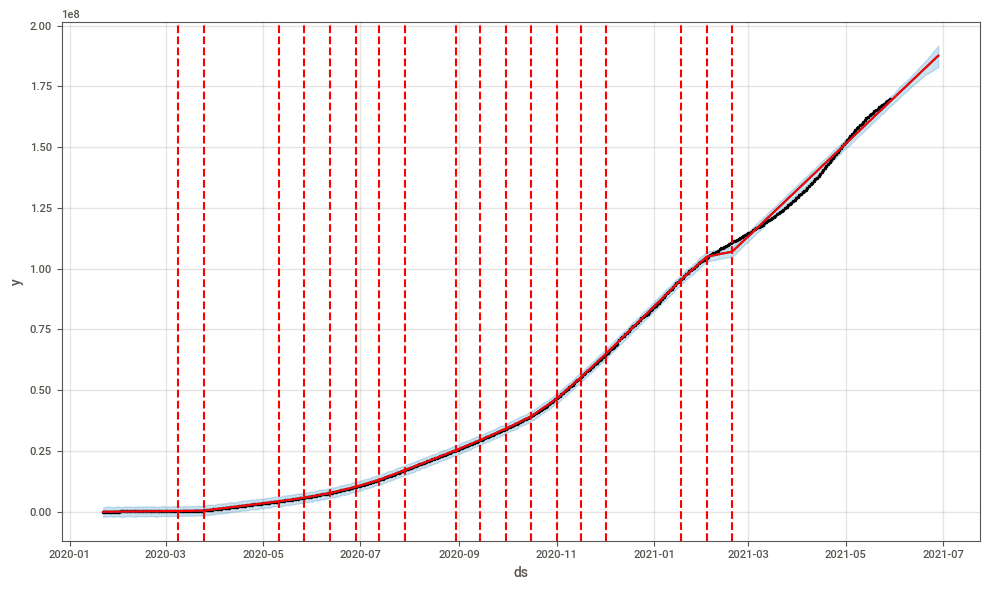

In [37]:
confirmed_forecast_plot = m.plot(forecast)
a = add_changepoints_to_plot(confirmed_forecast_plot.gca(), m, forecast)

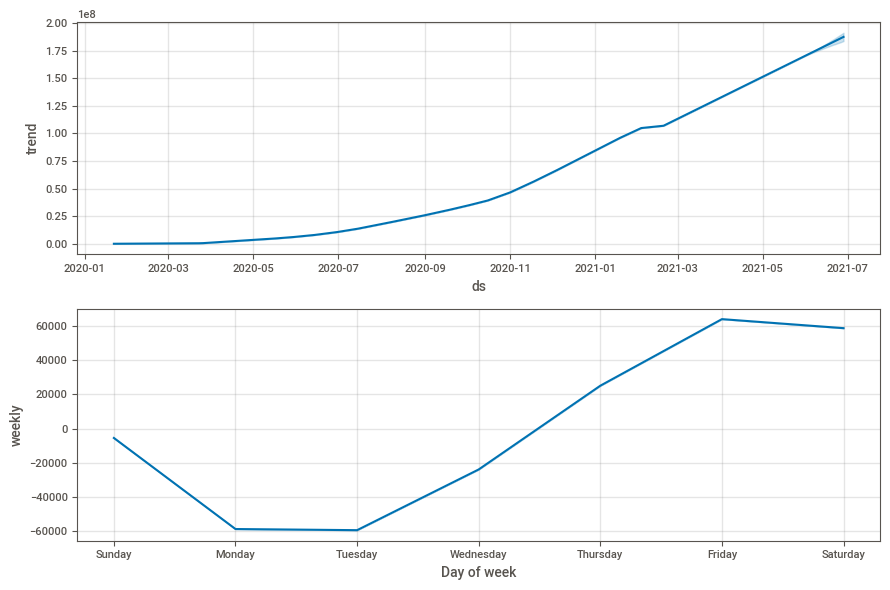

In [38]:
forecast_components = m.plot_components(forecast)

In [39]:
plot_plotly(m, forecast)

In [40]:
plot_components_plotly(m, forecast)

In [41]:
df_cv = cross_validation(m, initial='365 days', period='90 days', horizon = '30 days')

INFO:fbprophet:Making 2 forecasts with cutoffs between 2021-01-29 00:00:00 and 2021-04-29 00:00:00


  0%|          | 0/2 [00:00<?, ?it/s]

In [42]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-01-30,1.031186e+08,1.028362e+08,1.034003e+08,102645724.0,2021-01-29
1,2021-01-31,1.037190e+08,1.034124e+08,1.040113e+08,103027363.0,2021-01-29
2,2021-02-01,1.043213e+08,1.040301e+08,1.046367e+08,103474137.0,2021-01-29
3,2021-02-02,1.049608e+08,1.046728e+08,1.052655e+08,103932094.0,2021-01-29
4,2021-02-03,1.056257e+08,1.053157e+08,1.059474e+08,104454075.0,2021-01-29


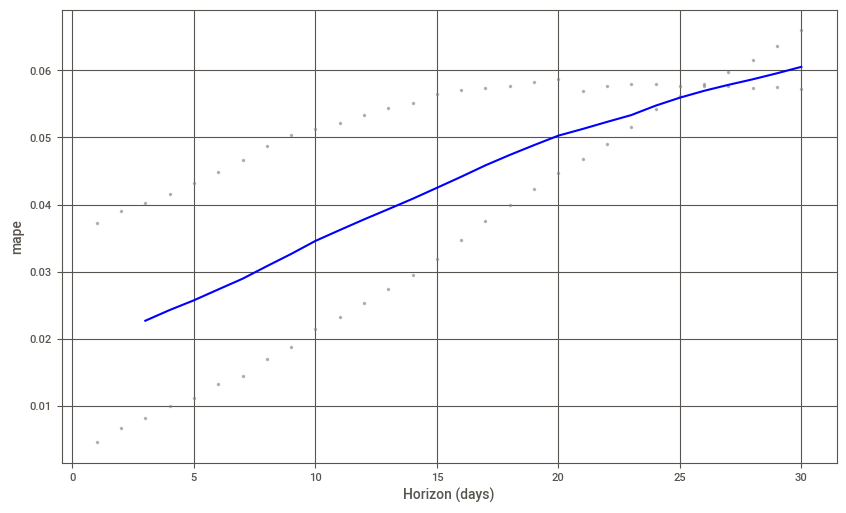

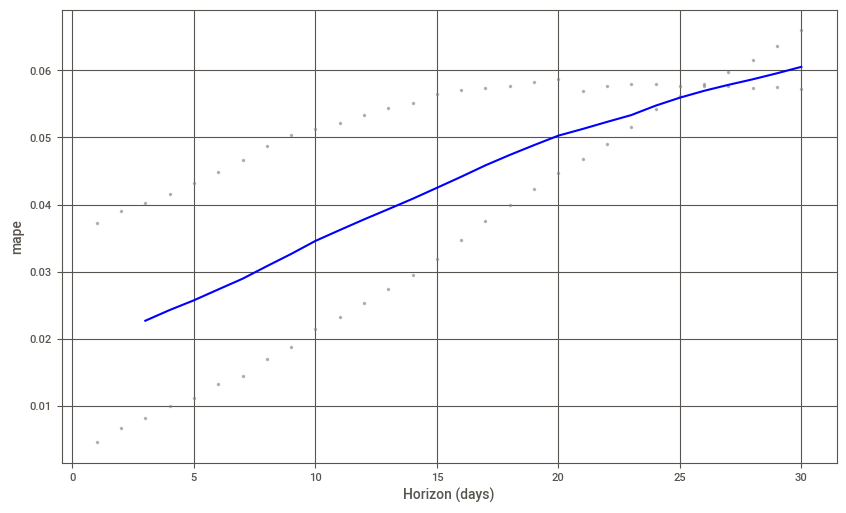

In [43]:
plot_cross_validation_metric(df_cv, metric='mape')

In [44]:
with open('phrophet_model.json', 'w') as fout:
    json.dump(model_to_json(m), fout)  # Save model

In [45]:
with open('phrophet_model.json', 'r') as fin:
    m = model_from_json(json.load(fin))  # Load model



---



In [2]:
%cd /content/

/content


In [3]:
import requests

url = 'https://raw.githubusercontent.com/DavorJordacevic/Novel-Corona-Virus-2019-Dataset/main/Python/custom.geo.json'
r = requests.get(url, allow_redirects=True)
open('custom.geo.json', 'wb').write(r.content)

3852029

In [101]:
data = pd.read_csv("/content/novel-corona-virus-2019-dataset/covid_19_data.csv")
data.rename(columns={'ObservationDate':'Date', 'Country/Region':'Country'}, inplace=True)

In [102]:
data['Country']= data['Country'].str.replace("Mainland China", "China")
data['Country']= data['Country'].str.replace("US", "United States")
data['Country']= data['Country'].str.replace("UK", "United Kingdom")
data['Country']= data['Country'].str.replace("Congo (Kinshasa)", "Dem. Rep. Congo")
data['Country']= data['Country'].str.replace("Congo (Brazzaville)", "Dem. Rep. Congo")
data['Country']= data['Country'].str.replace("Republic of the Congo", "Dem. Rep. Congo")
data['Country']= data['Country'].str.replace("Burma", "Myanmar")

In [103]:
data['Date'] = pd.to_datetime(data['Date'].astype(str), format='%m/%d/%Y')
data.sort_values(by='Date')

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
0,1,2020-01-22,Anhui,China,1/22/2020 17:00,1.0,0.0,0.0
22,23,2020-01-22,Qinghai,China,1/22/2020 17:00,0.0,0.0,0.0
23,24,2020-01-22,Shaanxi,China,1/22/2020 17:00,0.0,0.0,0.0
24,25,2020-01-22,Shandong,China,1/22/2020 17:00,2.0,0.0,0.0
25,26,2020-01-22,Shanghai,China,1/22/2020 17:00,9.0,0.0,0.0
...,...,...,...,...,...,...,...,...
305921,305922,2021-05-29,Casanare,Colombia,2021-05-30 04:20:55,20248.0,461.0,18982.0
305922,305923,2021-05-29,Castilla - La Mancha,Spain,2021-05-30 04:20:55,192347.0,5912.0,6392.0
305923,305924,2021-05-29,Castilla y Leon,Spain,2021-05-30 04:20:55,230600.0,6882.0,8716.0
305914,305915,2021-05-29,Callao,Peru,2021-05-30 04:20:55,95043.0,3449.0,0.0


In [104]:
last_updated_date = data.iloc[-1]['Date'].strftime("%Y-%m-%d")
print(last_updated_date)

2021-05-29


In [105]:
data = data[data['Date'] == last_updated_date]

In [106]:
data = data.groupby("Country")[['Confirmed']].sum().reset_index()

In [107]:
data.columns = ['zone','confirmed']

In [108]:
with open('custom.geo.json') as f:
    geo_world = json.load(f)

found = []
missing = []
countries_geo = []

tmp = data.set_index('zone')

for country in geo_world['features']:
    country_name = country['properties']['name'] 
    if country_name in tmp.index:
        found.append(country_name)
        geometry = country['geometry']
        
        countries_geo.append({
            'type': 'Feature',
            'geometry': geometry,
            'id':country_name
        })
        
    else:
        missing.append(country_name)

print(f'Countries found    : {len(found)}')
print(f'Countries not found: {len(missing)}')
geo_world_ok = {'type': 'FeatureCollection', 'features': countries_geo}

Countries found    : 167
Countries not found: 65


In [113]:
fig = px.choropleth(
    data,
    geojson=geo_world_ok,
    locations='zone',
    color=data['confirmed'],
    hover_name='zone',
    title='Covid-19 cases'
)

fig.update_layout(
    margin={'r':0,'t':0,'l':0,'b':0},
    coloraxis_colorbar={
        'title':'Total confirmed Covid-19 cases'  
    }
)
fig.show()



---

